# Prepare landscape myelopoiesis

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scvelo as scv
from cellrank.tl.estimators import GPCCA
import cellrank as cr

In [2]:
adata1 = sc.read('data/SRR12396124.loom')
adata1.var_names_make_unique()

adata2 = sc.read('data/SRR12396125.loom')
adata2.var_names_make_unique()

adata3 = sc.read('data/SRR12396126.loom') #T3
adata3.var_names_make_unique()

adata4 = sc.read('data/SRR12396133.loom')
adata4.var_names_make_unique()

adata5 = sc.read('data/SRR12396134.loom')
adata5.var_names_make_unique()

adata6 = sc.read('data/SRR12396135.loom') #T3
adata6.var_names_make_unique()

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.1

In [3]:
adata = adata1.concatenate(adata2,adata3,adata4,adata5,adata6)

In [4]:
sc.pp.filter_cells(adata, min_genes=0)
sc.pp.filter_genes(adata, min_cells=0)

In [5]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

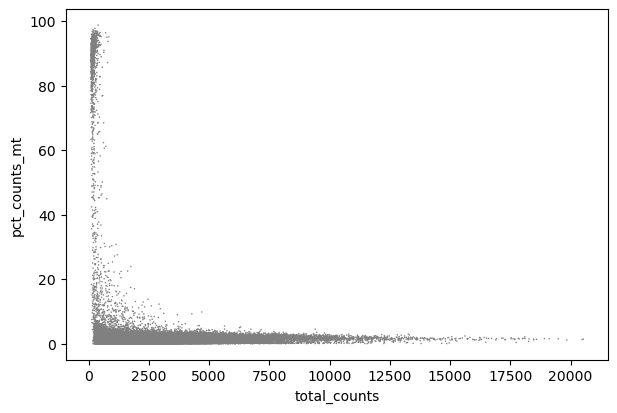

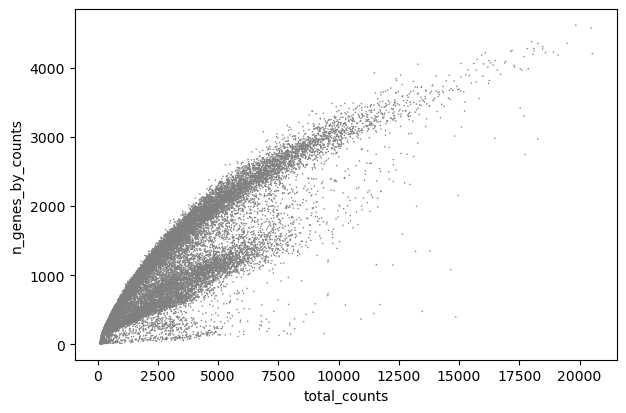

In [6]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
adata = adata[adata.obs.n_genes_by_counts < 3800, :].copy()
adata = adata[adata.obs.pct_counts_mt < 4, :].copy()
adata = adata[adata.obs.total_counts < 15000, :].copy()
adata = adata[adata.obs.n_genes_by_counts>200, :].copy()

# Landscape

In [17]:
sc.external.pp.scrublet(adata)

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.26
Detected doublet rate = 2.2%
Estimated detectable doublet fraction = 40.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.5%


In [19]:
adata = adata[~adata.obs.predicted_doublet].copy()

vec = np.array(['wt' for i in range(adata.shape[0])],dtype = 'str')
vec[(adata.obs.batch == '3') | (adata.obs.batch == '4') | (adata.obs.batch == '5') ] = 'ko'

adata.obs['wt_ko'] = vec

In [21]:
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

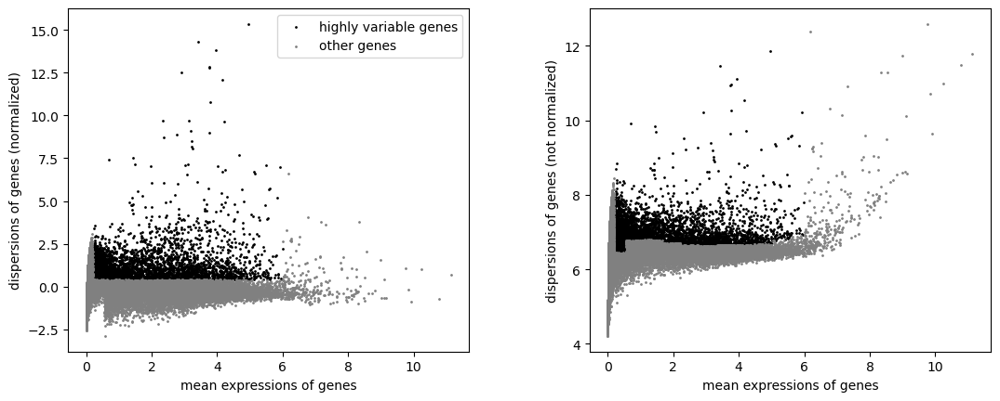

3594

In [23]:
sc.pp.highly_variable_genes(adata, min_mean=0.2, max_mean=6, min_disp=0.4)
sc.pl.highly_variable_genes(adata)
np.sum(adata.var.highly_variable)

In [25]:
adata.raw = adata

In [26]:
adata = adata[:, adata.var.highly_variable].copy()

In [30]:
sc.pp.regress_out(adata, ['total_counts', 'n_genes_by_counts'])
sc.pp.scale(adata)

In [31]:
sc.tl.pca(adata, svd_solver='arpack')

In [34]:
sc.external.pp.harmony_integrate(adata,key = 'batch')

2023-05-31 12:41:33,421 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-05-31 12:41:37,301 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-05-31 12:41:37,435 - harmonypy - INFO - Iteration 1 of 10
2023-05-31 12:41:42,664 - harmonypy - INFO - Iteration 2 of 10
2023-05-31 12:41:48,026 - harmonypy - INFO - Iteration 3 of 10
2023-05-31 12:41:53,244 - harmonypy - INFO - Iteration 4 of 10
2023-05-31 12:41:57,203 - harmonypy - INFO - Iteration 5 of 10
2023-05-31 12:41:59,805 - harmonypy - INFO - Iteration 6 of 10
2023-05-31 12:42:05,412 - harmonypy - INFO - Iteration 7 of 10
2023-05-31 12:42:08,020 - harmonypy - INFO - Converged after 7 iterations


In [2]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50,use_rep = 'X_pca_harmony')
sc.tl.umap(adata)

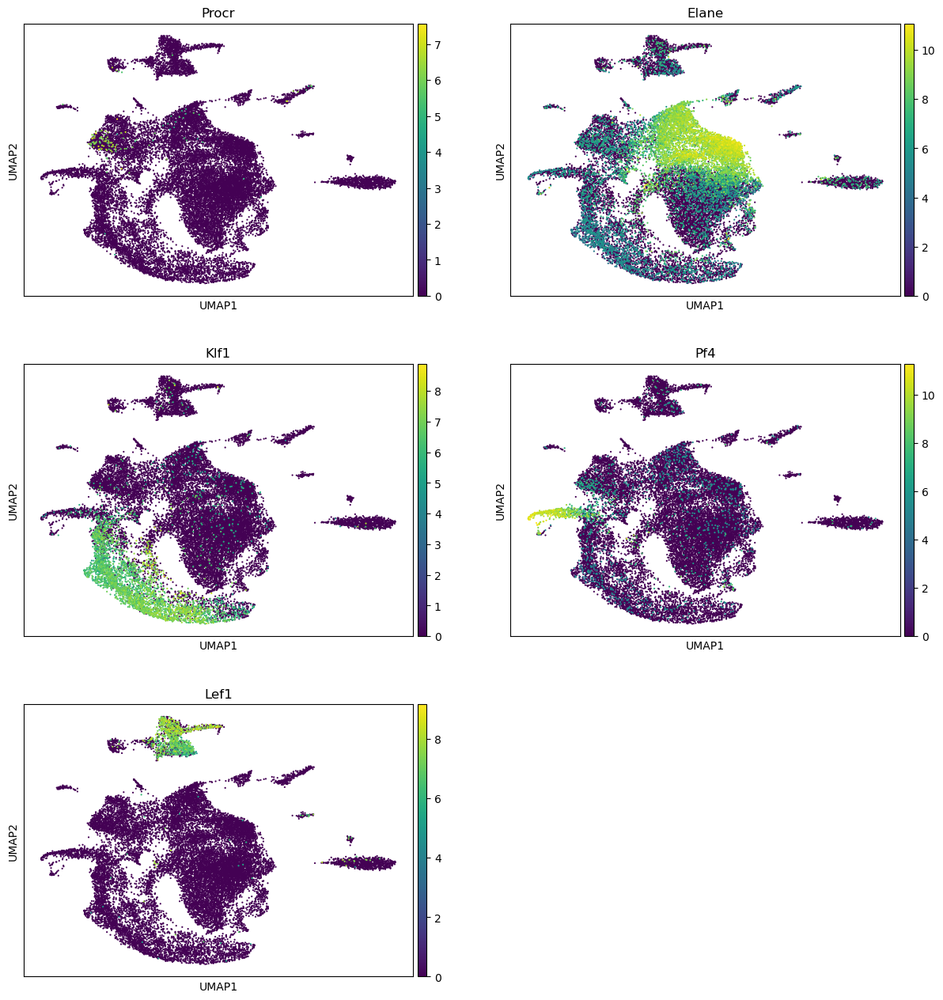

In [38]:
sc.pl.umap(adata, ncols=2,color=['Procr','Elane','Klf1','Pf4','Lef1'], s = 10)

In [42]:
sc.tl.leiden(adata, resolution=0.4)

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


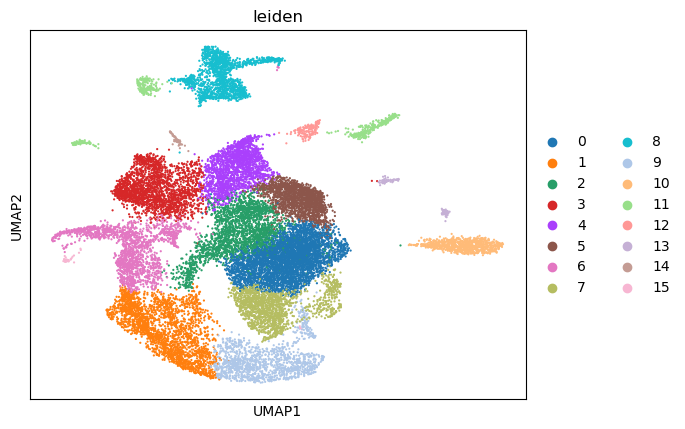

In [43]:
sc.pl.umap(adata, ncols=2,color=['leiden'], s = 10)

In [44]:
sc.tl.paga(adata, groups='leiden')

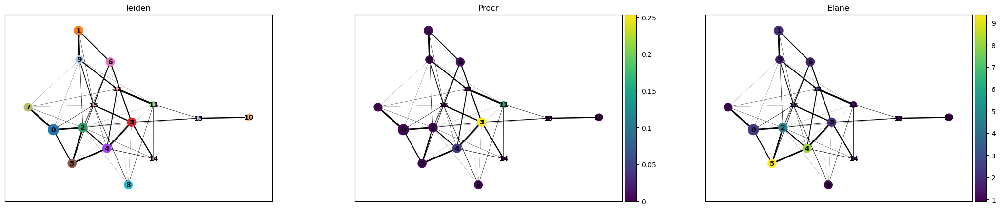

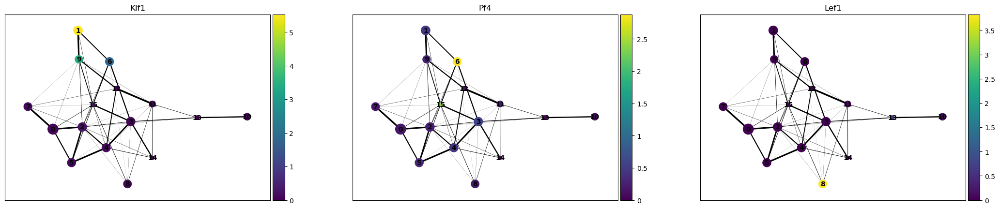

In [45]:
sc.pl.paga(adata, color=['leiden','Procr','Elane'])
sc.pl.paga(adata, color=['Klf1','Pf4','Lef1'])

In [46]:
sc.tl.umap(adata, init_pos='paga')

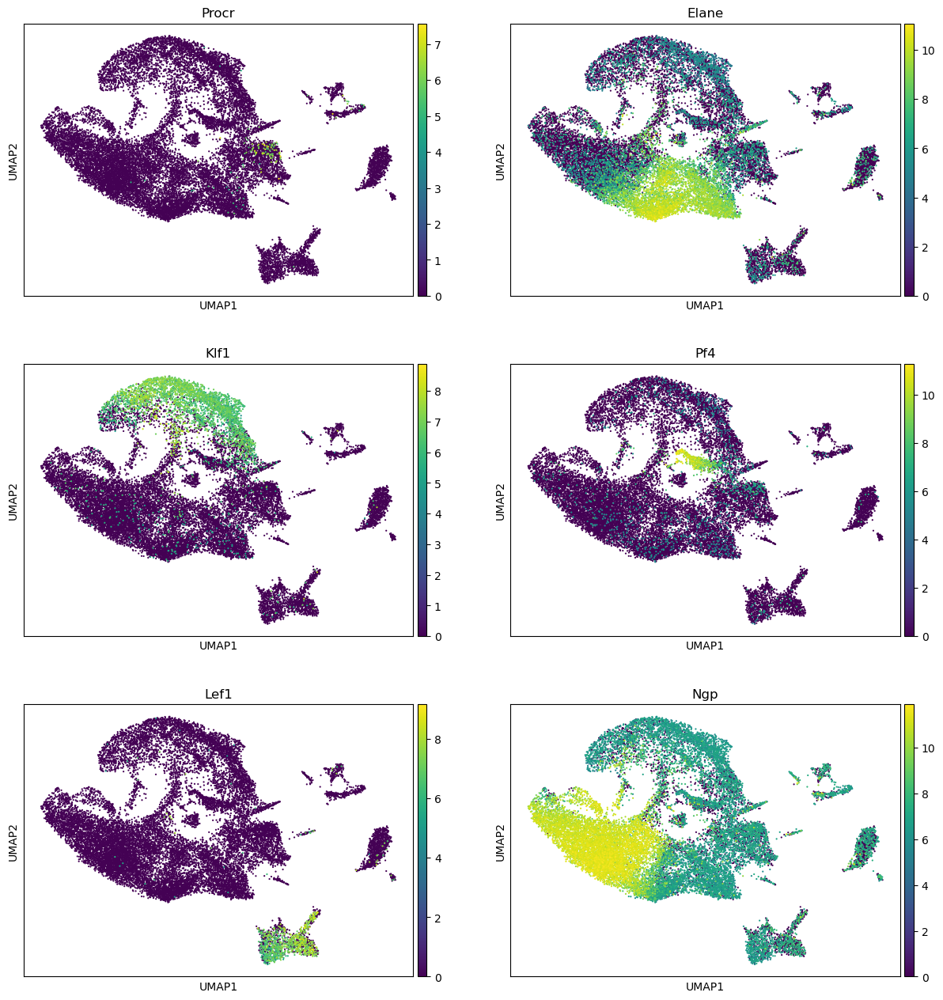

In [47]:
sc.pl.umap(adata, ncols=2,color=['Procr','Elane','Klf1','Pf4','Lef1','Ngp'], s = 10)

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


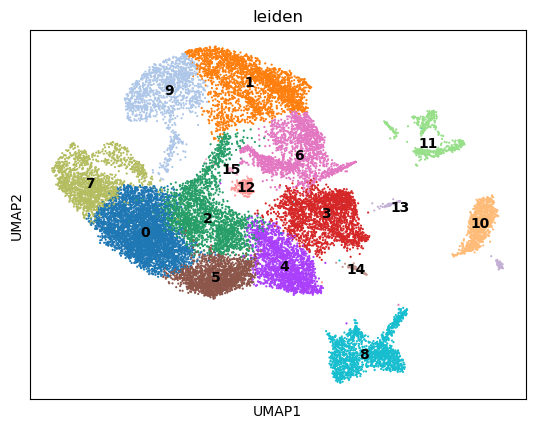

In [49]:
sc.pl.umap(adata, ncols=2,color=['leiden'], s = 10,legend_loc='on data')

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


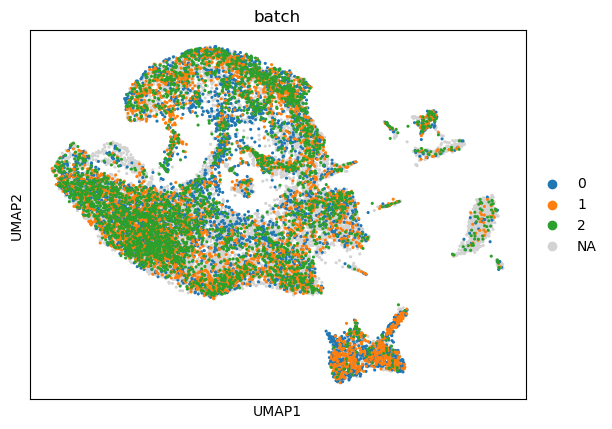

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


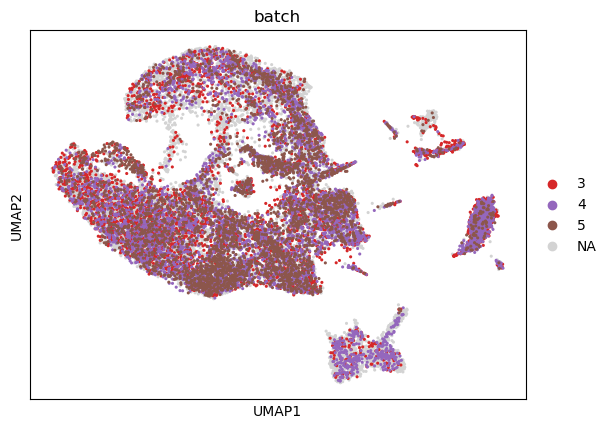

In [51]:
sc.pl.umap(adata, color=['batch'],groups=['0','1','2'], s = 20)
sc.pl.umap(adata, color=['batch'],groups=['3','4','5'], s = 20)

In [52]:
adata.obs.batch.value_counts()

4    4798
3    3798
0    3690
1    3587
5    3254
2    3102
Name: batch, dtype: int64

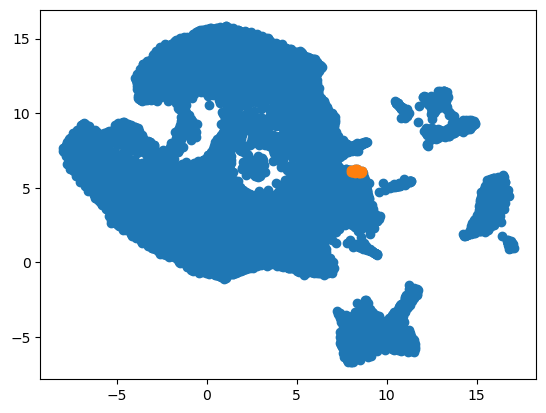

In [ ]:
plt.scatter(adata.obsm['X_umap'][:,0],adata.obsm['X_umap'][:,1])

log =( (adata.obsm['X_umap'][:,0] >= 8) & (adata.obsm['X_umap'][:,0] <= 10)
&(adata.obsm['X_umap'][:,1] >= 6)&(adata.obsm['X_umap'][:,1] <= 6.8))

plt.scatter(adata[log].obsm['X_umap'][:,0],adata[log].obsm['X_umap'][:,1] )

In [61]:
np.where(log)

(array([ 1556,  2615,  3305,  4168,  4398,  7102,  7730,  8080,  8454,
         8864,  9356, 10986, 12468, 15845, 16995, 18430, 19228, 20727,
        22125]),)

In [62]:
adata.uns['iroot'] = 1556

In [63]:
sc.tl.dpt(adata)

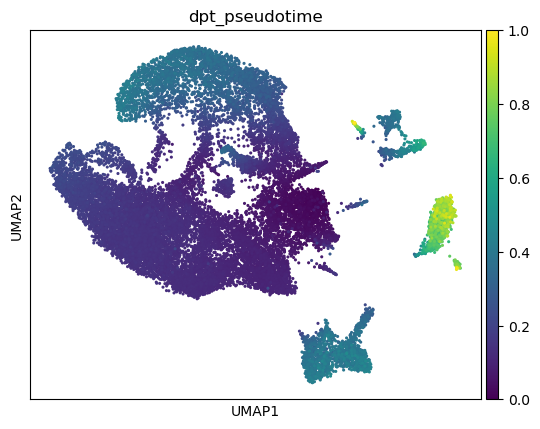

In [64]:
sc.pl.umap(adata, color=['dpt_pseudotime'], s = 20)

In [65]:
adata.obs = adata.obs[['wt_ko','leiden','dpt_pseudotime']].copy()

In [67]:
adata.layers["spliced"] = adata.raw[adata.obs_names,adata.var_names].X.copy()
adata.layers["unspliced"] = adata.raw[adata.obs_names,adata.var_names].X.copy()

In [68]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30, use_rep='X_pca_harmony')

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [69]:
dptk = cr.tl.kernels.PseudotimeKernel(adata)
dptk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)

dptk.compute_projection(basis="umap", key_added='T_fwd')


100%|█████████████████████████████████| 22229/22229 [00:04<00:00, 4770.84cell/s]


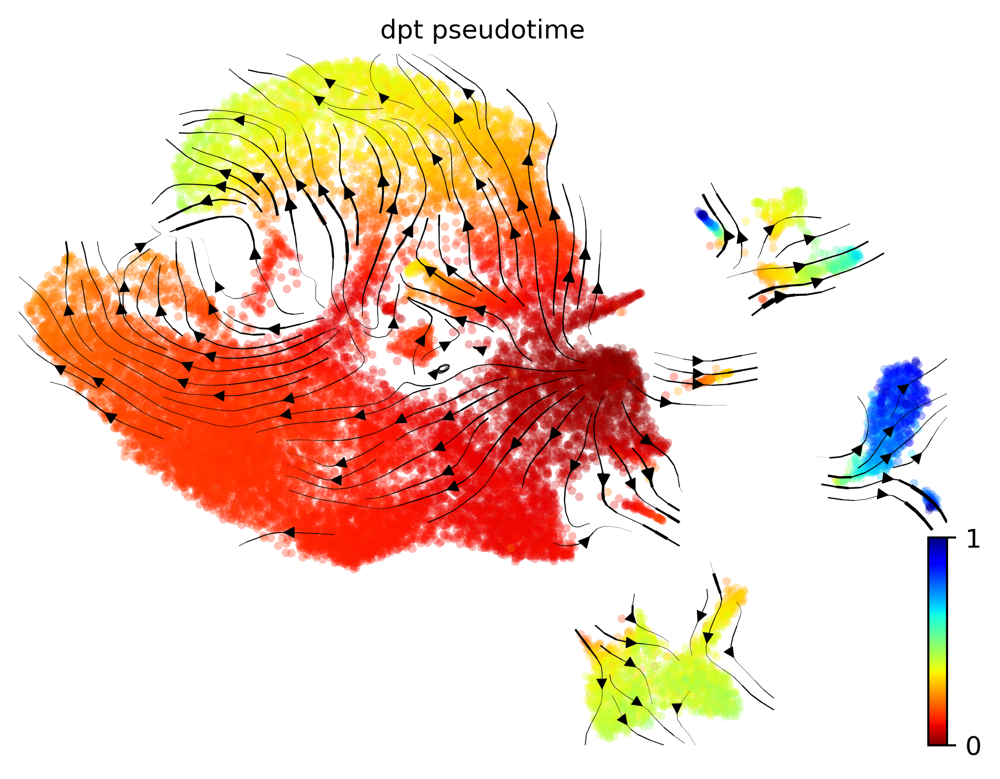

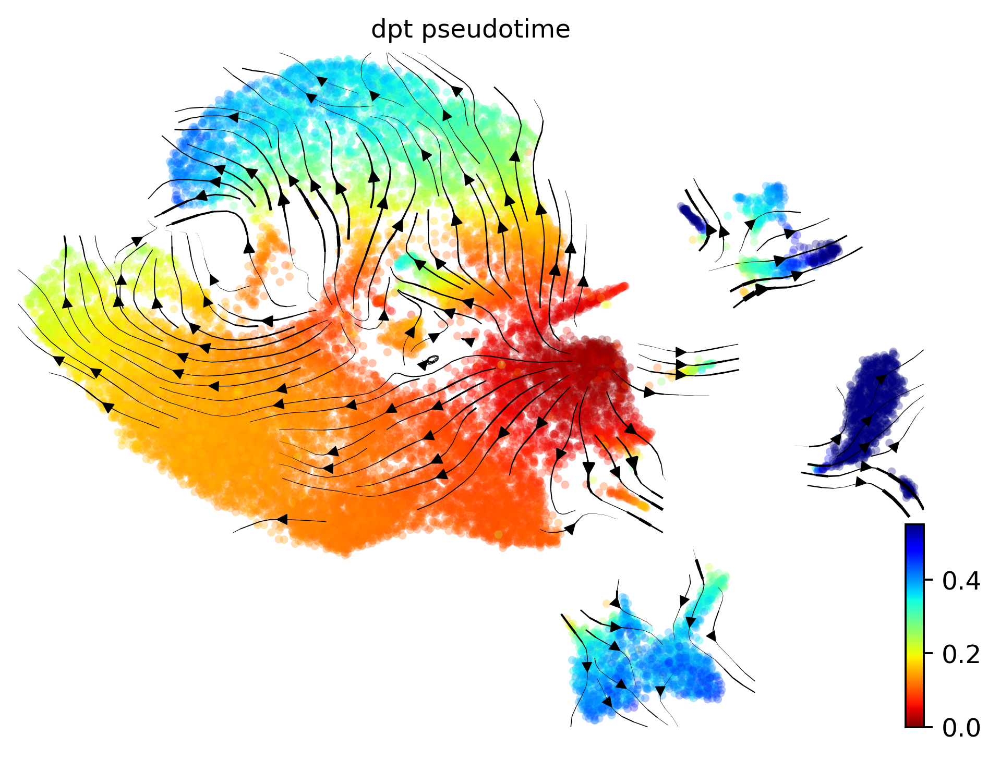

In [70]:
scv.pl.velocity_embedding_stream(
    adata, color="dpt_pseudotime", vkey="T_fwd", basis="umap", legend_loc="right", cmap='jet_r', dpi=350
)

scv.pl.velocity_embedding_stream(adata, color="dpt_pseudotime", vkey="T_fwd", basis="umap", legend_loc="right", cmap='jet_r', vmax=0.55, dpi=350
)


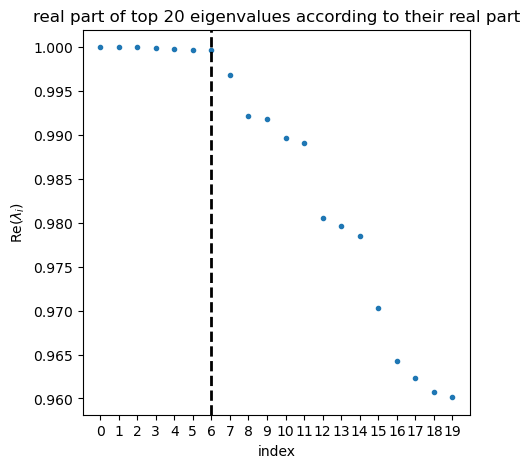

In [71]:
g = GPCCA(dptk)
g.compute_schur(n_components=20)
g.plot_spectrum(real_only=True)


/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


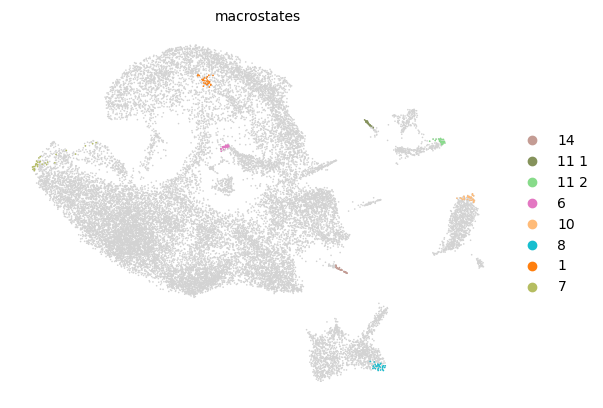

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


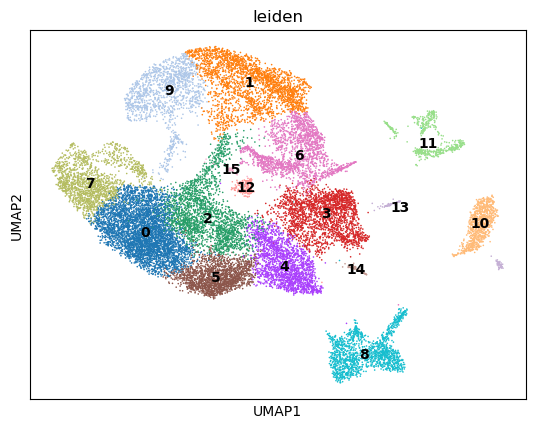

In [72]:

# %%
g.compute_macrostates(n_states=8, cluster_key="leiden")
g.plot_macrostates(discrete=True, basis="umap", legend_loc="right")

# %%
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

In [73]:
# We will set terminal states manually, they are largely consistent with the macrostates identified with GPCCA


def get_terminal_states(adata, clusters, cell_no=50, clusters_key='leiden',
                        pseudotime_key='dpt_pseudotime'):
    cells = pd.Series(np.nan, index=adata.obs_names)
    for i in clusters:
        cluster_adata = adata[adata.obs[clusters_key] == i, :]
        topT = cluster_adata.obs[pseudotime_key].sort_values(ascending=False)
        topT = topT.index[:cell_no].values
        cells[topT] = i
    return(pd.Series(cells, dtype="category"))

fates = ['7','8','9','10','11','12','13','14','15']
ends = get_terminal_states(adata, clusters=fates)

# %%
g.set_terminal_states(ends)

# %%
g.compute_absorption_probabilities(solver="gmres", tol=1e-9, preconditioner='ilu')
#This sometimes works and sometimes does not (values not summing up to 1)

# %%
scv.settings.set_figure_params("scvelo")
scv.set_figure_params(dpi=100, frameon=False, figsize=(4,4), dpi_save=350)
scv.settings.set_figure_params("scvelo")

g.plot_absorption_probabilities(same_plot=False, basis="umap",
                                dpi=350,
                                wspace=0.5,
                                perc=[0, 99],)

# %%
fates = pd.DataFrame(g.absorption_probabilities.X, columns = g.absorption_probabilities.names)
# fates.to_csv(base_procdata + 'pseudotime_kernel_fates.csv')

100%|███████████████████████████████████████████████| 9/9 [00:05<00:00,  1.75/s]
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/mb2338/miniconda3/envs/basic_scanpy/lib

In [74]:
fates

,10,11,12,13,14,15,7,8,9
0,0.006263,0.019748,0.018445,0.017686,0.052670,0.013079,0.135536,0.698778,0.037795
1,0.025531,0.017205,0.023322,0.021716,0.002032,0.020493,0.815287,0.018193,0.056220
2,0.003195,0.003054,0.005371,0.002721,0.000168,0.004575,0.963582,0.002669,0.014665
3,0.013012,0.011149,0.010012,0.011635,0.000657,0.014183,0.887751,0.012841,0.038761
4,0.000023,0.009017,0.000023,0.000144,0.000027,0.000024,0.000615,0.988459,0.001668
...,...,...,...,...,...,...,...,...,...
22224,0.000242,0.001483,0.000298,0.000122,0.000005,0.000786,0.001597,0.003979,0.991487
22225,0.026958,0.017752,0.022100,0.021762,0.002026,0.020271,0.821409,0.017156,0.050567
22226,0.000276,0.001515,0.000327,0.000173,0.000010,0.001363,0.002850,0.005417,0.988069
22227,0.016057,0.022661,0.034692,0.040155,0.020436,0.078459,0.392690,0.187803,0.207047


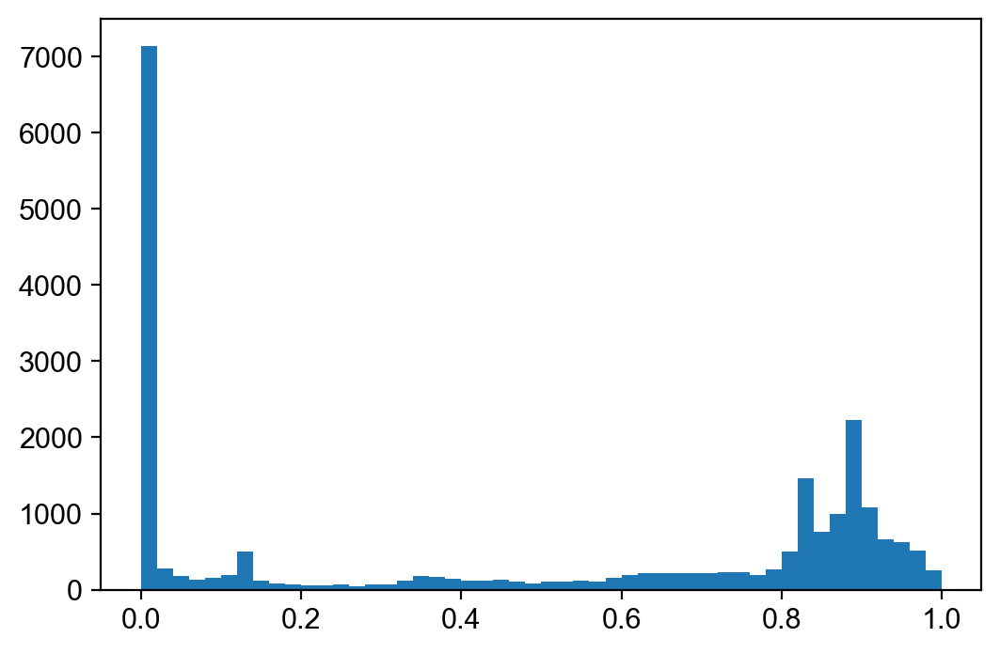

In [75]:
plt.hist(fates['7'],bins=50);

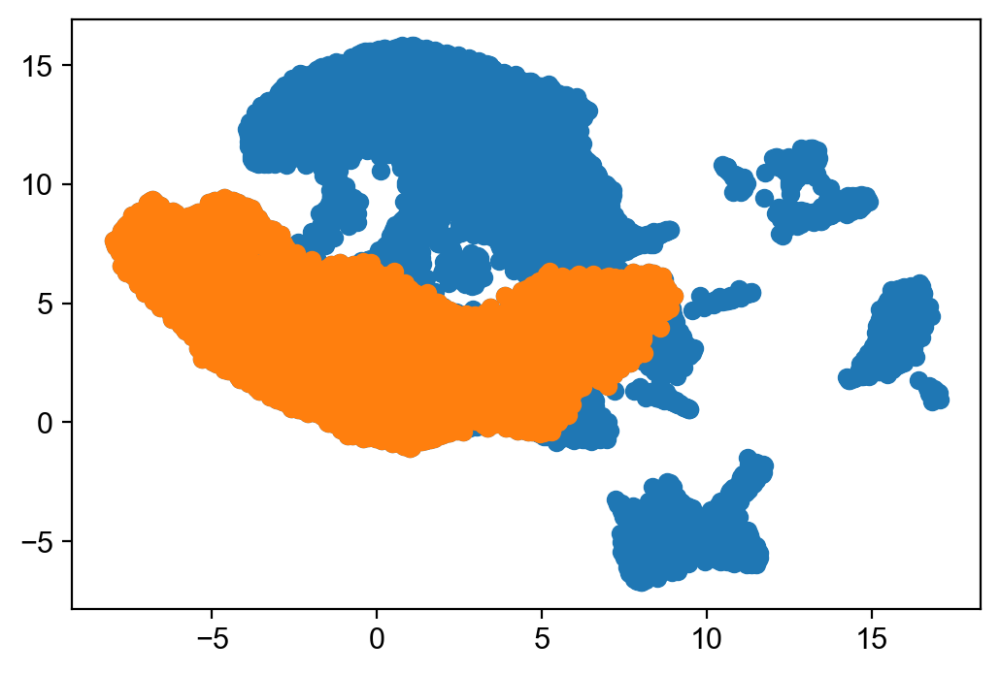

In [168]:
plt.scatter(adata.obsm['X_umap'][:,0],adata.obsm['X_umap'][:,1])

log =( ((fates['7']>0.3).values & (adata.obs.leiden == '3').values)|
( (fates['7']>0.63).values & (adata.obs.leiden == '4').values)|
( (fates['7']>0.78).values & (adata.obs.leiden == '2').values)|
( (fates['7']>0.81).values & (adata.obs.leiden == '5').values)|
( (fates['7']>0.82).values & (adata.obs.leiden == '0').values)|
( (fates['7']>0.3).values & (adata.obs.leiden == '7').values))

plt.scatter(adata[log].obsm['X_umap'][:,0],adata[log].obsm['X_umap'][:,1] )


In [170]:
adata_red = adata[log].copy()

In [171]:
adata_red.obs.leiden.value_counts()

0    4140
2    1727
3    1645
5    1629
7    1582
4    1261
Name: leiden, dtype: int64

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


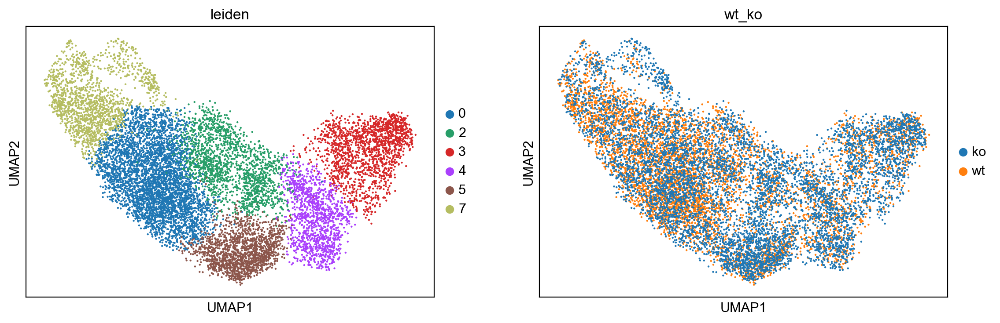

In [174]:
sc.pl.umap(adata_red,color = ['leiden','wt_ko'])

In [175]:
pd.crosstab(adata_red.obs.leiden,adata_red.obs.wt_ko)

wt_ko,ko,wt
leiden,,
0,1872,2268
2,1027,700
3,1078,567
4,816,445
5,1110,519
7,756,826


In [177]:
sc.tl.leiden(adata_red)

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


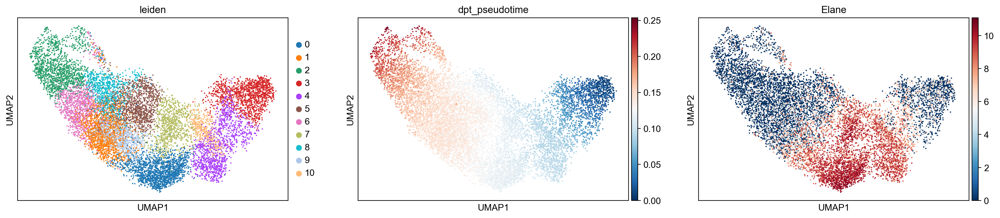

In [178]:
sc.pl.umap(adata_red,color = ['leiden','dpt_pseudotime','Elane'])

/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/mb2338/miniconda3/envs/basic_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


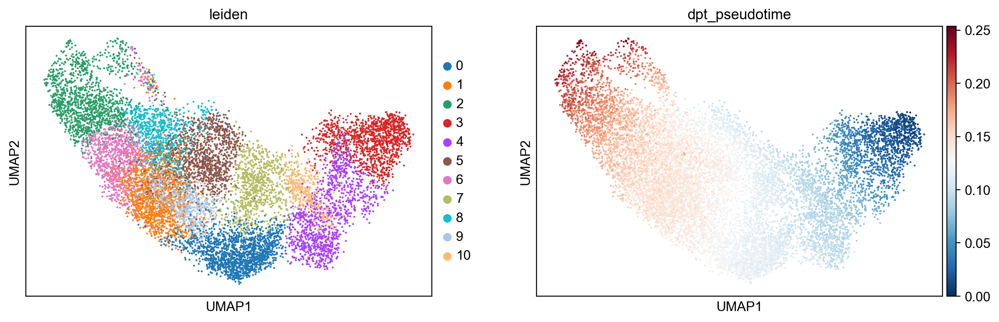

In [180]:
sc.pl.umap(adata_red,color = ['leiden','dpt_pseudotime'])

In [184]:
del adata_red.obs['terminal_states']

In [193]:
del adata_red.obsm['to_terminal_states']

In [194]:
adata_red.write('../results/adata_myelopoiesis.h5ad')